# JPEG Decoding Over and Over

Applies a small BrushCue brightness adjustment before every JPEG export to demonstrate how editing and re-encoding JPEGs repeatedly produces artifacts.

In [1]:
from io import BytesIO
from pathlib import Path

import brushcue
from PIL import Image

INPUT_IMAGE = Path("/home/dito/dev/monorepo/writing/graphics/chapters/files/assets/paris_street_rainy_day.jpg")


def reencode_jpeg(num_encodes: int) -> tuple[Image.Image, bytes]:
    """Apply alternating brightness edits and export the image as JPEG repeatedly."""
    if num_encodes < 0:
        raise ValueError("num_encodes must be non-negative")

    jpeg_bytes = INPUT_IMAGE.read_bytes()
    ctx = brushcue.Context()

    for encode_index in range(num_encodes):
        composition = brushcue.Composition.load(jpeg_bytes)
        brightness_offset = 0.1 if encode_index % 2 == 0 else -0.1
        edited = composition.brightness_adjust(brightness_offset)

        # BrushCue renders the edit to lossless PNG before the next JPEG export.
        png_bytes = bytes(edited.execute(ctx).to_image_bytes(ctx))
        with Image.open(BytesIO(png_bytes)) as png:
            encoded = BytesIO()
            png.convert("RGB").save(encoded, format="JPEG", quality=50)
            jpeg_bytes = encoded.getvalue()

    with Image.open(BytesIO(jpeg_bytes)) as image:
        return image.copy(), jpeg_bytes


new pipeline: color_transformer_shader_rgba16float_compute_12058872180443999691_inarr_false


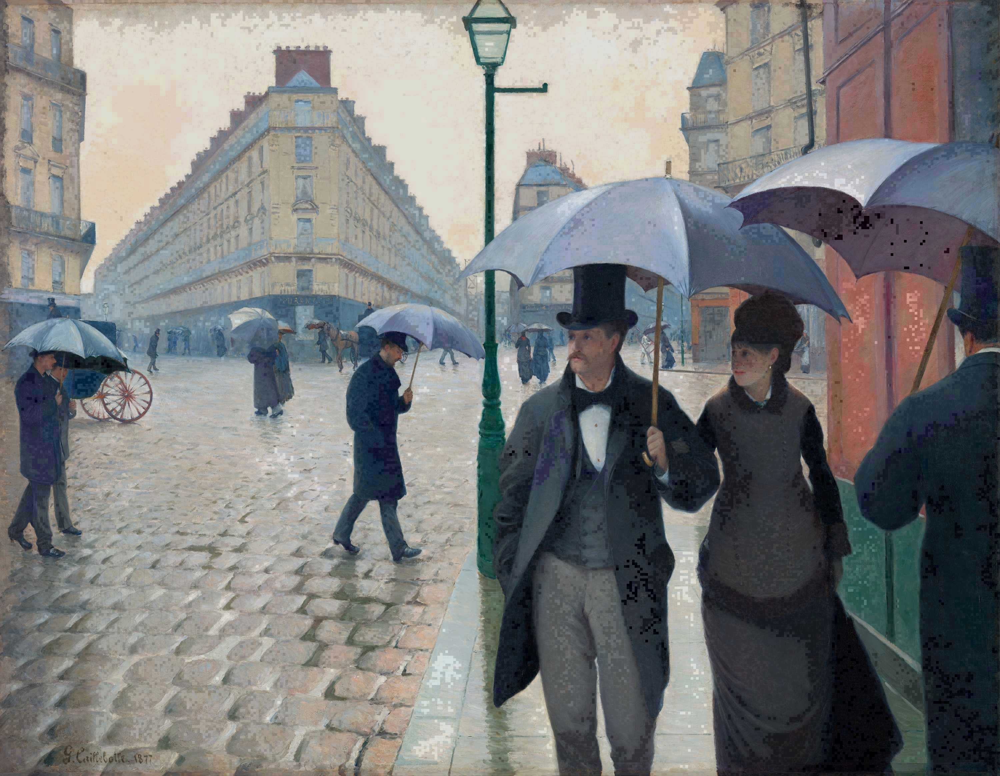

In [2]:
image_100, jpeg_bytes_100 = reencode_jpeg(100)
output_image = INPUT_IMAGE.with_name(f"{INPUT_IMAGE.stem}_100_jpeg_encodes.jpg")
output_image.write_bytes(jpeg_bytes_100)
image_100